Это вторая версия ноутбука, в первой у мееня было 40к данных, но возникли проблемы даже с мощными алгоритмами, например дерево решений на валидации давало точность по r2 порядка 60, а на тесте около 0, даже хуже, чем линейная регрессия. 

Из чего я сделал вывод, что в целевой величине какие-то проблемы, возможно плохой трейн-тест сплит.

Плюс алгоритмы фитились слишком долго

В этом ноутбуке я попробую побороться с этими проблемами

В этом ноутбуке:

1) Предобработка данных

2) Выбор лучших алгоримов:

Алгоритмы:
* Linear Regression no regularization
* Ridge Regressor
* Lasso Regressor
* Linear SVR
* SGD Regressor
* Decision Tree Regressor
* Random Forest Regressor
* Adaboost Regressor
* Gradient Boosting Regressor

3) Аналитика результатов (различные метрики, сравнение гистограмм, самые недооценённые и переоценённые модели в зависимости от признаков)

# Импорт библиотек

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn

import pandas_profiling as pp # подсмотрел в kernels, интересно

# Загурзка и предобработка данных

Датасет https://www.kaggle.com/austinreese/craigslist-carstrucks-data

In [2]:
# загрузка

df = pd.read_csv('vehicles.csv')

# отображение

df.head()

,id,url,region,region_url,price,year,manufacturer,model,condition,cylinders,...,drive,size,type,paint_color,image_url,description,county,state,lat,long
0,7119256118,https://mohave.craigslist.org/ctd/d/lake-havas...,mohave county,https://mohave.craigslist.org,3495,2012.0,jeep,patriot,like new,4 cylinders,...,NaN,NaN,NaN,silver,https://images.craigslist.org/00B0B_k2AXIJ21ok...,"THIS 2012 JEEP PATRIOT IS A 4CYL. AC, STEREO, ...",NaN,az,34.4554,-114.2690
1,7120880186,https://oregoncoast.craigslist.org/cto/d/warre...,oregon coast,https://oregoncoast.craigslist.org,13750,2014.0,bmw,328i m-sport,good,NaN,...,rwd,NaN,sedan,grey,https://images.craigslist.org/00U0U_3cLk0WGOJ8...,Selling my 2014 BMW 328i with the following be...,NaN,or,46.1837,-123.8240
2,7115048251,https://greenville.craigslist.org/cto/d/sparta...,greenville / upstate,https://greenville.craigslist.org,2300,2001.0,dodge,caravan,excellent,6 cylinders,...,NaN,NaN,NaN,NaN,https://images.craigslist.org/00k0k_t4WqYn5nDC...,"01 DODGE CARAVAN,3.3 ENGINE,AUT TRANS,199000 M...",NaN,sc,34.9352,-81.9654
3,7119250502,https://mohave.craigslist.org/cto/d/lake-havas...,mohave county,https://mohave.craigslist.org,9000,2004.0,chevrolet,colorado ls,excellent,5 cylinders,...,rwd,mid-size,pickup,red,https://images.craigslist.org/00J0J_lJEzfeVLHI...,"2004 Chevy Colorado LS, ONLY 54000 ORIGINAL MI...",NaN,az,34.4783,-114.2710
4,7120433904,https://maine.craigslist.org/ctd/d/searsport-t...,maine,https://maine.craigslist.org,0,2021.0,NaN,Honda-Nissan-Kia-Ford-Hyundai-VW,NaN,NaN,...,NaN,NaN,NaN,NaN,https://images.craigslist.org/01010_j0IW34mCsm...,CALL: 207.548.6500 TEXT: 207.407.5598 **WE FI...,NaN,me,44.4699,-68.8963


In [3]:
# кол-во данных в датасете

len(df)

435849

Целевая величина - цена (price). Задача регрессии

## Удаление неинформативных колонок

Удалим колонки id, url, region_url, image_url

In [4]:
# удаление неинформативных признаков
df = df.drop(['id', 'url', 'region_url','image_url'], axis = 1)

df.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,...,vin,drive,size,type,paint_color,description,county,state,lat,long
0,mohave county,3495,2012.0,jeep,patriot,like new,4 cylinders,gas,NaN,clean,...,NaN,NaN,NaN,NaN,silver,"THIS 2012 JEEP PATRIOT IS A 4CYL. AC, STEREO, ...",NaN,az,34.4554,-114.2690
1,oregon coast,13750,2014.0,bmw,328i m-sport,good,NaN,gas,76237.0,clean,...,NaN,rwd,NaN,sedan,grey,Selling my 2014 BMW 328i with the following be...,NaN,or,46.1837,-123.8240
2,greenville / upstate,2300,2001.0,dodge,caravan,excellent,6 cylinders,gas,199000.0,clean,...,NaN,NaN,NaN,NaN,NaN,"01 DODGE CARAVAN,3.3 ENGINE,AUT TRANS,199000 M...",NaN,sc,34.9352,-81.9654
3,mohave county,9000,2004.0,chevrolet,colorado ls,excellent,5 cylinders,gas,54000.0,clean,...,1GCCS196448191644,rwd,mid-size,pickup,red,"2004 Chevy Colorado LS, ONLY 54000 ORIGINAL MI...",NaN,az,34.4783,-114.2710
4,maine,0,2021.0,NaN,Honda-Nissan-Kia-Ford-Hyundai-VW,NaN,NaN,other,NaN,clean,...,NaN,NaN,NaN,NaN,NaN,CALL: 207.548.6500 TEXT: 207.407.5598 **WE FI...,NaN,me,44.4699,-68.8963


## Исследуем датасет на пропуски

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 435849 entries, 0 to 435848
Data columns (total 21 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   region        435849 non-null  object 
 1   price         435849 non-null  int64  
 2   year          434732 non-null  float64
 3   manufacturer  415102 non-null  object 
 4   model         429650 non-null  object 
 5   condition     249043 non-null  object 
 6   cylinders     269465 non-null  object 
 7   fuel          432858 non-null  object 
 8   odometer      360701 non-null  float64
 9   title_status  434043 non-null  object 
 10  transmission  433703 non-null  object 
 11  vin           239197 non-null  object 
 12  drive         313838 non-null  object 
 13  size          139888 non-null  object 
 14  type          318741 non-null  object 
 15  paint_color   300602 non-null  object 
 16  description   435822 non-null  object 
 17  county        0 non-null       float64
 18  stat

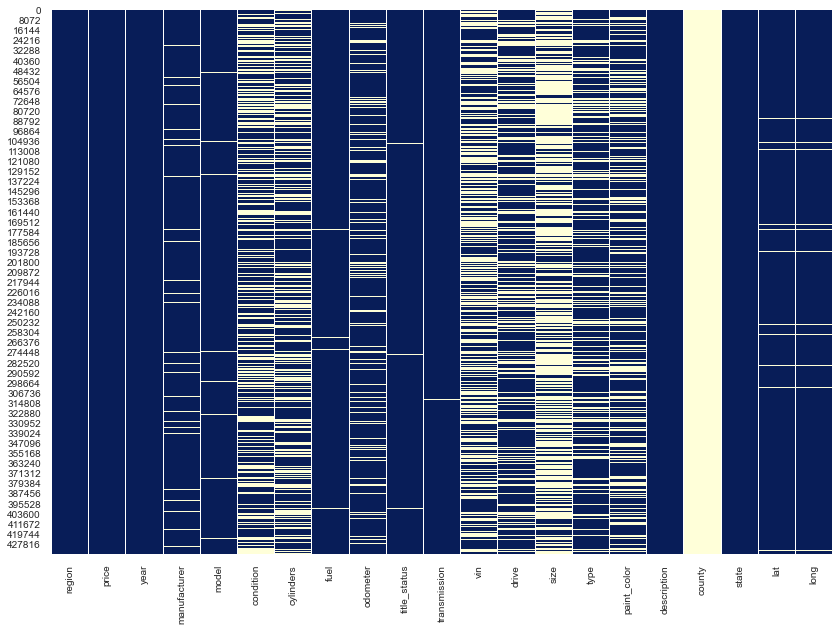

In [6]:
fig, ax = plt.subplots(figsize=(14,10))
sns.heatmap(df.isnull(), cbar=False, cmap="YlGnBu_r")
plt.show()

Признак county полностью пустой, удаляем

In [7]:
df = df.drop(['county'], axis = 1)

df.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,description,state,lat,long
0,mohave county,3495,2012.0,jeep,patriot,like new,4 cylinders,gas,NaN,clean,automatic,NaN,NaN,NaN,NaN,silver,"THIS 2012 JEEP PATRIOT IS A 4CYL. AC, STEREO, ...",az,34.4554,-114.2690
1,oregon coast,13750,2014.0,bmw,328i m-sport,good,NaN,gas,76237.0,clean,automatic,NaN,rwd,NaN,sedan,grey,Selling my 2014 BMW 328i with the following be...,or,46.1837,-123.8240
2,greenville / upstate,2300,2001.0,dodge,caravan,excellent,6 cylinders,gas,199000.0,clean,automatic,NaN,NaN,NaN,NaN,NaN,"01 DODGE CARAVAN,3.3 ENGINE,AUT TRANS,199000 M...",sc,34.9352,-81.9654
3,mohave county,9000,2004.0,chevrolet,colorado ls,excellent,5 cylinders,gas,54000.0,clean,automatic,1GCCS196448191644,rwd,mid-size,pickup,red,"2004 Chevy Colorado LS, ONLY 54000 ORIGINAL MI...",az,34.4783,-114.2710
4,maine,0,2021.0,NaN,Honda-Nissan-Kia-Ford-Hyundai-VW,NaN,NaN,other,NaN,clean,other,NaN,NaN,NaN,NaN,NaN,CALL: 207.548.6500 TEXT: 207.407.5598 **WE FI...,me,44.4699,-68.8963


Признаки condition, cylinders, vin заполнены меньше, чем на 50 процентов, но они важны, ( цена зависит от состояния авто, от кол-ва цилиндров), поэтому удалить их нельзя, так что просто почистим данные от null значений.

Признак size заполнен всего на 100к значений

К сожалению, мы потерям очень много данных.


In [8]:
df = df.dropna()

df.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,description,state,lat,long
3,mohave county,9000,2004.0,chevrolet,colorado ls,excellent,5 cylinders,gas,54000.0,clean,automatic,1GCCS196448191644,rwd,mid-size,pickup,red,"2004 Chevy Colorado LS, ONLY 54000 ORIGINAL MI...",az,34.4783,-114.2710
7,maine,8500,2005.0,ford,mustang convertible,excellent,6 cylinders,gas,62800.0,clean,automatic,1ZVHT84N355252184,rwd,mid-size,convertible,silver,2005 Ford Mustang Premium Convertible First ye...,me,44.2070,-69.7858
39,helena,10200,2013.0,nissan,juke nismo,excellent,4 cylinders,gas,45500.0,clean,automatic,JN8AF5MV9DT229954,4wd,compact,SUV,silver,2013 Nissan Juke Nismo - sport package SUV/ ha...,mt,46.5398,-112.1760
42,oregon coast,12998,2012.0,acura,mdx,good,6 cylinders,gas,132867.0,clean,automatic,2HNYD2H68CH526558,4wd,full-size,SUV,black,"2012 Acura MDX ADVANCE - $12,998 Year: 2012 M...",or,42.3899,-122.9220
43,oregon coast,17998,2013.0,ford,f-150,good,6 cylinders,gas,129079.0,clean,automatic,1FTFW1ET7DFA38975,4wd,full-size,truck,grey,"2013 Ford F-150 SUPERCREW - $17,998 Year: 201...",or,42.3899,-122.9220


In [9]:
len(df)

46244

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46244 entries, 3 to 435839
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   region        46244 non-null  object 
 1   price         46244 non-null  int64  
 2   year          46244 non-null  float64
 3   manufacturer  46244 non-null  object 
 4   model         46244 non-null  object 
 5   condition     46244 non-null  object 
 6   cylinders     46244 non-null  object 
 7   fuel          46244 non-null  object 
 8   odometer      46244 non-null  float64
 9   title_status  46244 non-null  object 
 10  transmission  46244 non-null  object 
 11  vin           46244 non-null  object 
 12  drive         46244 non-null  object 
 13  size          46244 non-null  object 
 14  type          46244 non-null  object 
 15  paint_color   46244 non-null  object 
 16  description   46244 non-null  object 
 17  state         46244 non-null  object 
 18  lat           46244 non-n

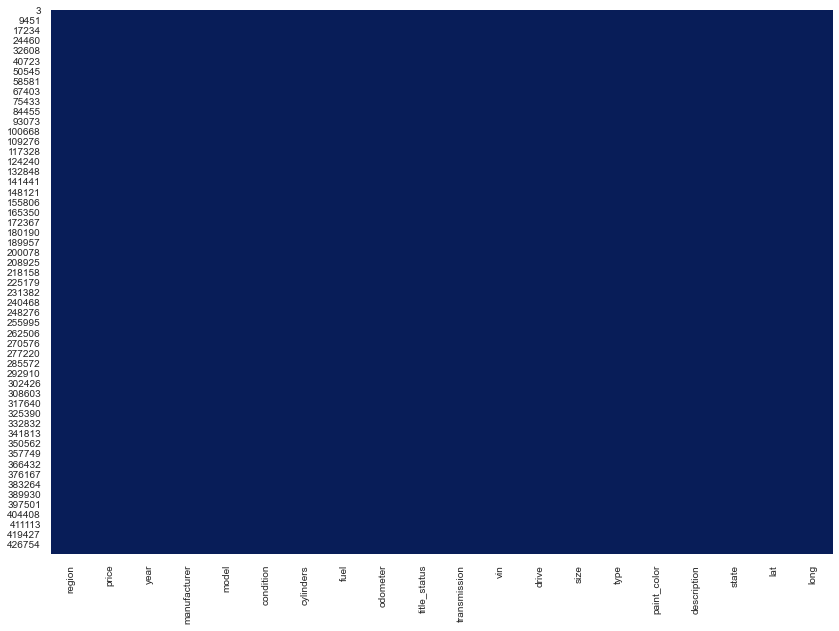

In [11]:
fig, ax = plt.subplots(figsize=(14,10))
sns.heatmap(df.isnull(), cbar=False, cmap="YlGnBu_r")
plt.show()

Больше null значений нет

## Посмотрим на основные статистики

In [12]:
df.describe()

,price,year,odometer,lat,long
count,4.624400e+04,46244.000000,4.624400e+04,46244.000000,46244.000000
mean,1.421482e+04,2010.522965,1.063333e+05,38.710267,-92.974704
std,3.251965e+05,6.958517,9.260219e+04,5.568841,17.515632
min,0.000000e+00,1923.000000,0.000000e+00,-48.146900,-159.386000
25%,5.800000e+03,2008.000000,6.281650e+04,35.086500,-104.794000
50%,1.015000e+04,2012.000000,1.020000e+05,39.531400,-88.063100
75%,1.699800e+04,2015.000000,1.399295e+05,42.674600,-80.200700
max,6.990899e+07,2020.000000,9.999999e+06,64.993700,94.163200


array([<matplotlib.axes._subplots.AxesSubplot object at 0x00000022BF92B4C8>,
      dtype=object)

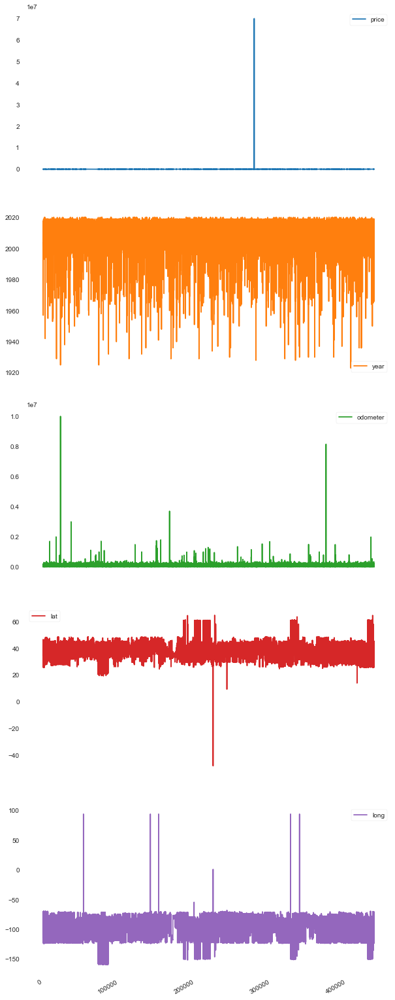

In [13]:
# проверим на выбросы

df.plot(subplots=True, figsize=(10, 30))

В данных есть выбросы, нужно будет использовать нормировку, чтобы уменьшить их вклад

## Посмотрим на целевую величину, есть подозрения, что что-то не так

In [14]:
df['price'].value_counts()

0        3003
7995      621
6995      609
8995      601
5995      575
         ... 
3790        1
50999       1
26467       1
18375       1
8298        1
Name: price, Length: 3603, dtype: int64

Цена 0 - явно аномальная (неправильно заполнена), так что ограничим цену например от 600, так же  ограничим по величине (например 10000), так как слишком дорогих машин тоже очень мало

In [15]:
df = df[df['price'] > 600]
df = df[df['price'] < 10000]

In [16]:
len(df)

19550

In [17]:
df['price'].value_counts()

7995    621
6995    609
8995    601
5995    575
9995    539
       ... 
4934      1
2901      1
6360      1
8399      1
6948      1
Name: price, Length: 1070, dtype: int64

## Выделим отдельно description, так как там текст

Я пытался представить description в виде tf idf, но получалось слишком большое пр-во признаков, попробовал понизить размерность через TruncatedSVD, упал по опретивке.

Было решено пока выделить отдельно этот признак, и исключить, поработать с датасетом без текста

In [18]:
description = df['description'].copy()

df = df.drop(['description'], axis = 1)

description

3         2004 Chevy Colorado LS, ONLY 54000 ORIGINAL MI...
7         2005 Ford Mustang Premium Convertible First ye...
46        One owner - Fish, Wildlife and Parks. Lots and...
52        This cute little SUV has no issues - gets good...
57        Ac ice cold  Just replaced control arm and tie...
                                ...                        
435675    2008 CHEVY SUBURBAN LT, 8 CYL, AUTOMATIC, ICE ...
435686    2000 TOYOTA AVALON, V6, AUTOMATIC, ICE COLD A/...
435706    1998 MERCURY MOUNTAINEER,V8, AUTOMATIC, ICE CO...
435794    I am selling 2008 Toyota Sienna 3.5 L V6 XLE. ...
435838    2008 FORD EXPEDITION EDDIE BAUER -- V8 -- $6,9...
Name: description, Length: 19550, dtype: object

## Посмотрим на типы данных

In [19]:
df.dtypes

region           object
price             int64
year            float64
manufacturer     object
model            object
condition        object
cylinders        object
fuel             object
odometer        float64
title_status     object
transmission     object
vin              object
drive            object
size             object
type             object
paint_color      object
state            object
lat             float64
long            float64
dtype: object

Очень много категориальных признаков, используем label encoder, чтобы не сильно увеличить пр-во признаков

In [20]:
from sklearn import preprocessing

# функция кодировки 
def number_encode_features(init_df):
    result = init_df.copy() 
    encoders = {}
    for column in result.columns:
        if result.dtypes[column] == np.object:
            encoders[column] = preprocessing.LabelEncoder() 
            result[column] = encoders[column].fit_transform(result[column])
    return result, encoders


encoded_data, encoders = number_encode_features(df)
encoded_data.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,state,lat,long
3,207,9000,2004.0,6,946,0,4,2,54000.0,0,0,3611,2,2,8,8,3,34.4783,-114.2710
7,192,8500,2005.0,11,2446,0,5,2,62800.0,0,0,6041,2,2,2,9,21,44.2070,-69.7858
46,132,9500,2009.0,29,16,2,6,2,193151.0,0,0,651,0,1,10,9,26,46.5398,-112.1760
52,132,6500,2007.0,14,1038,2,3,2,154171.0,0,0,11656,0,2,0,4,26,46.7074,-111.9580
57,308,1800,2001.0,14,859,2,3,2,188000.0,0,0,4885,1,0,3,10,9,26.1487,-80.2075


## Посмотрим на гистограммы распределений

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000022C98B3AC8>,
      dtype=object)

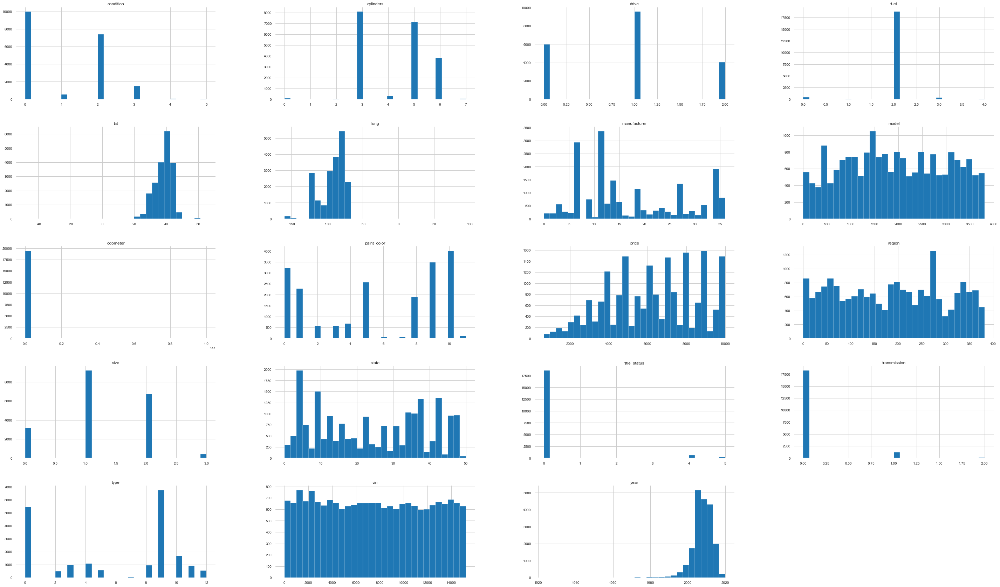

In [21]:
%matplotlib inline
encoded_data.hist(bins=30,figsize=(50,30))

## Построим матрицу корреляций

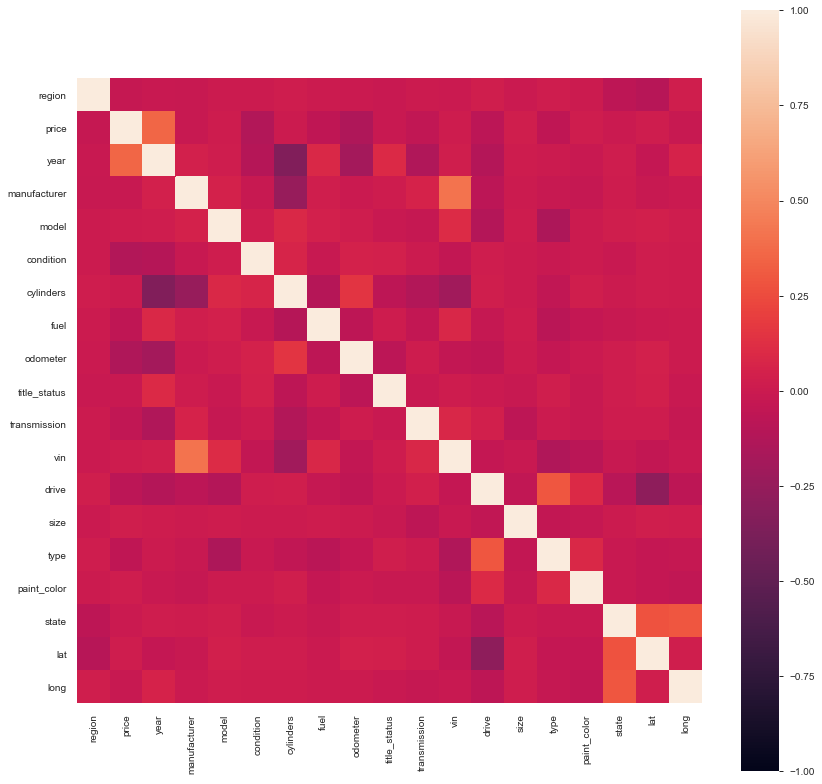

In [22]:
plt.subplots(figsize=(14,14))
sns.heatmap(encoded_data.corr(), vmin=-1, square=True)
plt.show()

Прямо и обратно коррелирующих признаков нет, хотя казалось, что рамзер машины и кол-во цилиндров должны быть связананы линейно.

## Общая информация

In [23]:
# это я подсмотрел

pp.ProfileReport(encoded_data)

## Немного перемешаем данные на всякий

In [24]:
# перемешаем 3 раза 
# этого делать не стоило, так как разная перемешка каждый раз ломает сохранённые модели

for i in range(3):
    encoded_data = encoded_data.sample(frac=1).reset_index(drop=True)

encoded_data.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,state,lat,long
0,70,6490,2009.0,34,2018,0,3,2,181250.0,0,0,12730,1,1,0,0,43,32.9311,-96.7456
1,203,6995,2008.0,2,2720,0,6,2,106972.0,4,0,13977,0,1,0,0,23,44.9608,-93.1216
2,292,9595,2014.0,9,832,2,6,2,112000.0,0,0,6181,2,2,9,0,9,27.0933,-82.4498
3,164,800,2000.0,6,813,1,3,2,201000.0,0,1,9146,1,0,2,4,15,40.7492,-86.0680
4,278,1500,2017.0,27,1818,3,3,2,110000.0,0,0,5744,2,2,10,9,4,38.6108,-121.4030


## Разделим данные и целевую величину

In [25]:
y = np.array(encoded_data['price'], float) # ответы
y

array([6490., 6995., 9595., ..., 5500., 8950., 8650.])

In [26]:
encoded_data = encoded_data.drop(['price'], axis= 1)
print('Ответы \n', y)
print('Выборка')
encoded_data.head()

Ответы 
 [6490. 6995. 9595. ... 5500. 8950. 8650.]
Выборка


,region,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,state,lat,long
0,70,2009.0,34,2018,0,3,2,181250.0,0,0,12730,1,1,0,0,43,32.9311,-96.7456
1,203,2008.0,2,2720,0,6,2,106972.0,4,0,13977,0,1,0,0,23,44.9608,-93.1216
2,292,2014.0,9,832,2,6,2,112000.0,0,0,6181,2,2,9,0,9,27.0933,-82.4498
3,164,2000.0,6,813,1,3,2,201000.0,0,1,9146,1,0,2,4,15,40.7492,-86.0680
4,278,2017.0,27,1818,3,3,2,110000.0,0,0,5744,2,2,10,9,4,38.6108,-121.4030


In [27]:
# преобразуем выборку в np.array
X = np.array(encoded_data, float)
X

array([[ 7.00000e+01,  2.00900e+03,  3.40000e+01, ...,  4.30000e+01,
         3.29311e+01, -9.67456e+01],
       [ 2.03000e+02,  2.00800e+03,  2.00000e+00, ...,  2.30000e+01,
         4.49608e+01, -9.31216e+01],
       [ 2.92000e+02,  2.01400e+03,  9.00000e+00, ...,  9.00000e+00,
         2.70933e+01, -8.24498e+01],
       ...,
       [ 6.50000e+01,  2.00400e+03,  3.00000e+00, ...,  3.50000e+01,
         4.00210e+01, -8.28079e+01],
       [ 1.82000e+02,  2.01400e+03,  2.70000e+01, ...,  2.90000e+01,
         4.08591e+01, -9.66710e+01],
       [ 0.00000e+00,  2.01600e+03,  1.50000e+01, ...,  4.00000e+00,
         3.73539e+01, -1.21989e+02]])

## Сделаем train-test split

In [28]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

## Нормализуем данные

In [29]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train, X_test

(array([[ 1.39216414, -0.11980491, -1.15765483, ..., -0.99853725,
         -2.06055511,  0.68518339],
        [-1.15591   , -1.27257707, -1.25492786, ...,  0.74250205,
          0.58159891,  0.58432557],
        [-0.73123098,  0.70360378, -1.15765483, ..., -1.26638945,
          0.54144499, -0.58838159],
        ...,
        [-1.23723152, -1.60194055, -0.28219753, ...,  0.20679765,
         -0.60051606,  0.66724019],
        [-0.59569512, -0.9432136 , -1.0603818 , ..., -0.1280176 ,
          0.9184291 ,  0.38679368],
        [ 1.28373546,  0.04487683, -0.57401663, ..., -0.663722  ,
          0.06681895,  0.12504547]]),
 array([[ 0.75966347,  0.04487683, -1.44947393, ..., -1.3333525 ,
          0.19784164, -1.52094733],
        [-1.37276738, -1.10789534,  1.46871707, ..., -0.32890675,
          0.83812126,  1.19055762],
        [-1.24626724,  0.53892204,  0.98235191, ...,  1.0773173 ,
         -1.00317478,  0.69817656],
        ...,
        [-0.79448105, -0.28448665, -0.57401663, ..., -

# Обучение алгоритмов

## Linear Regression

### No regularization

In [30]:
# модель 

from sklearn.linear_model import LinearRegression

linear_regressor = LinearRegression()

# обучим на трейне

linear_regressor.fit(X_train, y_train)

preds_linear_regressor = linear_regressor.predict(X_test)

In [31]:
# посмтотрим на метрики на тесте

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

print('test mse: ', mean_squared_error(y_test, preds_linear_regressor))
print('test r2: ', r2_score(y_test, preds_linear_regressor))

test mse:  4248594.429487354
test r2:  0.1940249759645949


In [32]:
# сравним предсказания 
    
y_test, preds_linear_regressor

(array([4000., 7950., 5499., ..., 4000., 5500., 8200.]),
 array([4621.10053418, 6924.00303595, 6328.13146165, ..., 6446.36128622,
        4828.00850286, 6873.19757163]))

In [33]:
# сохраним модель
import pickle

with open('models\\linear_regressor.pkl', 'wb') as f:
    pickle.dump(linear_regressor, f)   

Линейная регрессия без регуляризации сработала очень плохо для данного датасета

### Ridge Regressor

In [35]:
# модель без тюнинга

from sklearn.linear_model import Ridge

ridge_regressor_one = Ridge()

# обучим на трейне

ridge_regressor_one.fit(X_train, y_train)

preds_ridge_regressor_one = ridge_regressor_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_ridge_regressor_one))
print('test r2: ', r2_score(y_test, preds_ridge_regressor_one))

test mse:  4248603.123548965
test r2:  0.1940233266670136


Не сильно отличается от обычной линейной регрессии, проведём тюнинг модели

In [38]:
# тюнинг

from sklearn.model_selection import GridSearchCV

alg = Ridge()

grid = {'alpha': np.array(np.linspace(0, 100, 100), dtype='float')}

gs = GridSearchCV(alg, grid, verbose=1,n_jobs=-1, scoring='r2')

#  кросс-валидация

gs.fit(X_train, y_train)

# отобразим лучшие параметры

gs.best_params_, gs.best_score_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    2.1s finished


({'alpha': 100.0}, 0.11206392658030825)

In [39]:
# обучим на трейне

ridge_regressor = Ridge(alpha=100)

ridge_regressor.fit(X_train, y_train)

preds_ridge_regressor = ridge_regressor.predict(X_test)

In [40]:
# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_ridge_regressor))
print('test r2: ', r2_score(y_test, preds_ridge_regressor))

test mse:  4249521.981432694
test r2:  0.19384901572319113


Стало хуже, идём дальше, сохранять не будем

### Lasso Regressor

In [41]:
# создадим даск клиент для параллельных вычислений

from dask.distributed import Client
import joblib

client = Client(n_workers=8, threads_per_worker = 2) 
client

Client Scheduler: tcp://127.0.0.1:57153 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 8 Cores: 16 Memory: 17.12 GB


In [42]:
# модель без тюнинга

from sklearn.linear_model import Lasso

lasso_regressor_one = Lasso()

# обучим на трейне

lasso_regressor_one.fit(X_train, y_train)

preds_lasso_regressor_one = lasso_regressor_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_lasso_regressor_one))
print('test r2: ', r2_score(y_test, preds_lasso_regressor_one))

test mse:  4249306.769807733
test r2:  0.19388984221239336


Тоже хуже обычной линейной регрессии, проведём тюнинг

In [43]:
# тюнинг

alg = Lasso(max_iter=10000)

grid = {'alpha': np.array(np.linspace(0, 100, 100), dtype='float'),
       'selection':['cyclic','random']}

gs = GridSearchCV(alg, grid, verbose=1,n_jobs = -1, scoring='r2')

In [44]:
# параллельная кросс-валидация

with joblib.parallel_backend('dask'):
    gs.fit(X_train, y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:    8.5s
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed:   13.1s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:   47.7s finished


In [45]:
# отобразим лучшие параметры

gs.best_params_, gs.best_score_

({'alpha': 100.0, 'selection': 'cyclic'}, 0.13091780365090233)

In [46]:
# обучим на трейне

lasso_regressor = Lasso(max_iter=10000, alpha=100,selection='cyclic')

lasso_regressor.fit(X_train, y_train)

preds_lasso_regressor = lasso_regressor.predict(X_test)

In [47]:
# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_lasso_regressor))
print('test r2: ', r2_score(y_test, preds_lasso_regressor))

test mse:  4417298.828572426
test r2:  0.16202108988788222


In [50]:
# отобразим предсказания

y_test, preds_lasso_regressor

(array([4000., 7950., 5499., ..., 4000., 5500., 8200.]),
 array([4982.51888463, 6859.31603577, 6437.19927725, ..., 6182.93242436,
        4902.7272896 , 6824.74622134]))

Тоже хуже, чем линейная регрессия, сохранять не будем

## Linear SVR

In [51]:
# модель без тюнинга

from sklearn.svm import LinearSVR

# обучим на трейне

svr_one = LinearSVR()

svr_one.fit(X_train, y_train)

preds_svr_one = svr_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_svr_one))
print('test r2: ', r2_score(y_test, preds_svr_one))

test mse:  5301589.451657706
test r2:  -0.0057323090359684414


Очень плохо, проведём тюнинг

In [52]:
# тюнинг

alg = LinearSVR()

grid = {'C': np.array(np.linspace(0, 6, 30), dtype='float'),
       'loss':['epsilon_insensitive','squared_epsilon_insensitive']}

gs = GridSearchCV(alg, grid, verbose=1, n_jobs = -1, scoring='r2')

In [53]:
# параллельная кросс-валидация

with joblib.parallel_backend('dask'):
    gs.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:   46.3s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:  1.5min finished
D:\conda\lib\site-packages\sklearn\svm\_base.py:977: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [54]:
# отобразим лучшие параметры

gs.best_params_, gs.best_score_

({'C': 0.41379310344827586, 'loss': 'squared_epsilon_insensitive'},
 0.12223421612703891)

In [55]:
# обучим на трейне

svr = LinearSVR(max_iter=10000, C= 0.41379310344827586, loss='squared_epsilon_insensitive')

svr.fit(X_train, y_train)

preds_svr = svr.predict(X_test)

D:\conda\lib\site-packages\sklearn\svm\_base.py:977: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [56]:
# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_svr))
print('test r2: ', r2_score(y_test, preds_svr))

test mse:  4240506.621114644
test r2:  0.1955592649290454


In [57]:
# отобразим предсказания

y_test, preds_svr

(array([4000., 7950., 5499., ..., 4000., 5500., 8200.]),
 array([4609.09565839, 6918.23660026, 6325.17780256, ..., 6445.14973793,
        4810.41108433, 6883.79078038]))

In [58]:
# сохраним модель

with open('models\\svr.pkl', 'wb') as f:
    pickle.dump(svr, f)   

Чуть-чуть лучше линейной регрессии, сохраним модель и идём дальше

## SGDRegressor

In [59]:
# модель без тюнинга

from sklearn.linear_model import SGDRegressor

# обучим на трейне

sgdr_one = SGDRegressor()

sgdr_one.fit(X_train, y_train)

preds_sgdr_one = sgdr_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_sgdr_one))
print('test r2: ', r2_score(y_test, preds_sgdr_one))

test mse:  8536638.965023989
test r2:  -0.6194338878910082


Ооооочень плохо, попробуем провести тюнинг

In [60]:
# тюнинг

alg = SGDRegressor()

grid = {'alpha': np.array(np.linspace(0, 1, 50), dtype='float'),
       'penalty':['l1','l2','elasticnet']}

gs = GridSearchCV(alg, grid, verbose=1, n_jobs = -1, scoring='r2')

In [61]:
# параллельная кросс-валидация

with joblib.parallel_backend('dask'):
    gs.fit(X_train, y_train)

Fitting 5 folds for each of 150 candidates, totalling 750 fits


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 750 out of 750 | elapsed:   12.2s finished


In [62]:
# отобразим лучшие параметры

gs.best_params_, gs.best_score_

({'alpha': 0.2857142857142857, 'penalty': 'elasticnet'}, 0.15664363262218867)

In [63]:
# обучим на трейне

sgdr = SGDRegressor(alpha= 0.2857142857142857, penalty='elasticnet')

sgdr.fit(X_train, y_train)

preds_sgdr = sgdr.predict(X_test)

In [64]:
# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_sgdr))
print('test r2: ', r2_score(y_test, preds_sgdr))

test mse:  4433311.913028942
test r2:  0.15898334497155253


In [65]:
# отобразим предсказания

y_test, preds_sgdr

(array([4000., 7950., 5499., ..., 4000., 5500., 8200.]),
 array([4959.84678587, 6792.46956095, 6198.36268453, ..., 6449.11690077,
        5522.46348774, 6736.67931752]))

Модель хуже, не будем сохранять

## Decision Tree Regressor

In [66]:
# модель без тюнинга

from sklearn.tree import DecisionTreeRegressor

# обучим на трейне

dtr_one = DecisionTreeRegressor(max_depth=10)

dtr_one.fit(X_train, y_train)

preds_dtr_one = dtr_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_dtr_one))
print('test r2: ', r2_score(y_test, preds_dtr_one))

test mse:  2842985.6039731265
test r2:  0.4606744822261054


Намного лучше, чем все пердыдущие модели, проведём тюнинг, попробуем получить метрики ещё лучше

In [67]:
# тюнинг

alg = DecisionTreeRegressor()

grid = {'criterion': ['mse','friedman_mse','mae'],
       'splitter':['best','random'],
       'max_depth': [i for i in range(5, 20, 3)],
       'min_samples_split': [i for i in range(0, 100, 10)],
       'min_samples_leaf':[i for i in range(2, 6)]}

gs = GridSearchCV(alg, grid, verbose=1, cv=3, n_jobs = -1, scoring='r2')

In [68]:
# параллельная кросс-валидация

with joblib.parallel_backend('dask'):
    gs.fit(X_train, y_train)

Fitting 3 folds for each of 1200 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 692 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 1392 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 2292 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 2936 tasks      | elapsed:  9.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed: 21.5min finished


In [69]:
# отобразим лучшие параметры

gs.best_params_, gs.best_score_

({'criterion': 'mse',
  'max_depth': 17,
  'min_samples_leaf': 3,
  'min_samples_split': 80,
  'splitter': 'best'},
 0.43817823775555764)

In [70]:
# обучим на трейне

dtr = DecisionTreeRegressor(criterion='mse', splitter='best', max_depth=17, min_samples_split=80, min_samples_leaf=3)

dtr.fit(X_train, y_train)

preds_dtr = dtr.predict(X_test)

In [72]:
# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_dtr))
print('test r2: ', r2_score(y_test, preds_dtr))

test mse:  2750346.2016565893
test r2:  0.4782485401287577


In [73]:
# сравним предсказания

y_test, preds_dtr

(array([4000., 7950., 5499., ..., 4000., 5500., 8200.]),
 array([2775.17105263, 8456.66216216, 6618.61016949, ..., 3551.41666667,
        4240.85483871, 8957.09375   ]))

In [74]:
# сохраним модель

with open('models\\dtr.pkl', 'wb') as f:
    pickle.dump(dtr, f)   

Получили пока что лучшие метрики качества, попробуем более сложные алгоритмы, так как этого всё ещё не достаточно. Модель сохраняем

## Random Forest Regressor

In [75]:
# модель без тюнинга

from sklearn.ensemble import RandomForestRegressor

# обучим на трейне

rfr_one = RandomForestRegressor()

rfr_one.fit(X_train, y_train)

preds_rfr_one = rfr_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_rfr_one))
print('test r2: ', r2_score(y_test, preds_rfr_one))


test mse:  1680241.8175873607
test r2:  0.6812515381754923


Метрики стали гораздо лучше, проведём тюнинг, уже приближаемся к хорошим результатам

In [76]:
# тюнинг

alg = RandomForestRegressor()

grid = {'criterion': ['mse','mae'],
       'max_depth': [i for i in range(5, 15, 3)],
       'min_samples_split': [i for i in range(0, 50, 5)],
       'min_samples_leaf':[i for i in range(2, 6)]}

gs = GridSearchCV(alg, grid, verbose=1, cv=3, n_jobs = -1, scoring='r2')

In [77]:
# параллельная кросс-валидация

with joblib.parallel_backend('dask'):
    gs.fit(X_train, y_train)

Fitting 3 folds for each of 320 candidates, totalling 960 fits


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 418 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 768 tasks      | elapsed: 321.8min
[Parallel(n_jobs=-1)]: Done 960 out of 960 | elapsed: 531.5min finished


In [78]:
# отобразим лучшие параметры

gs.best_params_, gs.best_score_

({'criterion': 'mse',
  'max_depth': 14,
  'min_samples_leaf': 2,
  'min_samples_split': 5},
 0.6196658329240372)

In [81]:
# обучим на трейне

rfr = RandomForestRegressor(criterion='mse', max_depth=14, min_samples_split=5, min_samples_leaf=2 )

rfr.fit(X_train, y_train)

preds_rfr = rfr.predict(X_test)

In [82]:
# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_rfr))
print('test r2: ', r2_score(y_test, preds_rfr))

test mse:  1821754.539572427
test r2:  0.6544060198761634


In [83]:
y_test, preds_rfr

(array([4000., 7950., 5499., ..., 4000., 5500., 8200.]),
 array([2942.35283866, 8828.99109878, 6049.11680241, ..., 4245.97164887,
        3857.99196117, 8141.0937318 ]))

После тюнинга результат вышел хуже, но я сохраню обе модели ( жалко потраченного времени)))

In [84]:
# сохраним модель, *эта лучше

with open('models\\rfr_simple.pkl', 'wb') as f:
    pickle.dump(rfr_one, f) 

In [85]:
# сохраним модель

with open('models\\rfr.pkl', 'wb') as f:
    pickle.dump(rfr, f) 

## Adaboost Regressor

In [87]:
# без тюнинга

from sklearn.ensemble import AdaBoostRegressor

# обучим на трейне

abr_one = AdaBoostRegressor()

abr_one.fit(X_train, y_train)

preds_abr_one = abr_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_abr_one))
print('test r2: ', r2_score(y_test, preds_abr_one))

test mse:  3753682.2317380086
test r2:  0.28791176066401714


Результат сильно хуже, попробуем тюнинг

In [91]:
# тюнинг

alg = AdaBoostRegressor()

grid = {'loss': ['linear','square','exponential'],
       'learning_rate': [0.01, 0.05 ,0.1, 0.2, 0.3, 0.5, 1]}

gs = GridSearchCV(alg, grid, verbose=1, cv=5, n_jobs = -1, scoring='r2')

In [92]:
# параллельная кросс-валидация

with joblib.parallel_backend('dask'):
    gs.fit(X_train, y_train)

Fitting 5 folds for each of 21 candidates, totalling 105 fits


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 105 out of 105 | elapsed:   35.8s finished


In [93]:
# отобразим лучшие параметры

gs.best_params_, gs.best_score_

({'learning_rate': 0.1, 'loss': 'exponential'}, 0.332327642329712)

In [95]:
# обучим на трейне

abr = AdaBoostRegressor(learning_rate=0.1, loss='exponential')

abr.fit(X_train, y_train)

preds_abr = abr.predict(X_test)

In [97]:
# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_abr))
print('test r2: ', r2_score(y_test, preds_abr))

test mse:  3451602.157361429
test r2:  0.3452175353730561


In [98]:
y_test, preds_abr

(array([4000., 7950., 5499., ..., 4000., 5500., 8200.]),
 array([4201.87649402, 7378.88227469, 6136.17663043, ..., 5652.66469985,
        5162.427716  , 7372.67637388]))

Сильно проигрывает случайному лесу, сохранять не буду

## Gradient Boosting Regressor

In [99]:
# без тюнинга

from sklearn.ensemble import GradientBoostingRegressor

# обучим на трейне

gbr_one = GradientBoostingRegressor()

gbr_one.fit(X_train, y_train)

preds_gbr_one = gbr_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_gbr_one))
print('test r2: ', r2_score(y_test, preds_gbr_one))

test mse:  2294150.6087670755
test r2:  0.5647906330600281


Стандартный GradientBoostingRegressor из sklearn проигрывает случайному лесу

Тюнинг на cpu не очень хочется проводить, это может затянуться, как со случайным лесом

В другом ноутбуке я попробую Cat Boost Regressor на gpu в колабе, он явно сработает быстрее

Из перебранных алгоритмов самый лучший Random Forest Regressor, проведём аналитику предсказаний на нём, а потом перейдём к Cat Boost Regressor

# Анализ результатов

Это делалось на следующий день после обучения моделей, поэтому данные немного поменялись после перезапуска (я лишний раз их шафлил на всякий случай в начале, не ожидал, что процесс обучения так затянется и придётся переносить работу)

## Загрузим обученную модель и сделаем предсказания

In [30]:
# загрузка модели

import pickle

with open('models\\rfr_simple.pkl', 'rb') as f:
    alg_1 = pickle.load(f)

In [31]:
# предсказания 

preds_alg_1 = alg_1.predict(X_test)

In [32]:
# метрики на тесте

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

print('test mse: ', mean_squared_error(y_test, preds_alg_1))
print('test mae: ', mean_absolute_error(y_test, preds_alg_1))
print('test rmse: ', (mean_squared_error(y_test, preds_alg_1)) ** 0.5)
print('test r2: ', r2_score(y_test, preds_alg_1))

test mse:  651430.1766336025
test mae:  548.3599012057919
test rmse:  807.1122453745838
test r2:  0.8774712242705223


Получились не очень корректные результаты, так как я перезапускал систему, данные перемешались по другому и в обучающую и тестовую выборку попали одинаковые значения при загрузке уже обученной модели.

Правильно будет заново обучить модели с лучшими параметрами на новых тестовых данных, благо, они не долго обучаются

Но на каких-то новых данных можно будет использовать те обученные модели

## Обучим лучшие модели заново и сделаем предсказания

In [33]:
# модель без тюнинга

from sklearn.ensemble import RandomForestRegressor

# обучим на трейне

rfr_one = RandomForestRegressor()

rfr_one.fit(X_train, y_train)

preds_rfr_one = rfr_one.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_rfr_one))
print('test mae: ', mean_absolute_error(y_test, preds_rfr_one))
print('test rmse: ', (mean_squared_error(y_test, preds_rfr_one)) ** 0.5)
print('test r2: ', r2_score(y_test, preds_rfr_one))

test mse:  1670402.3541066914
test mae:  924.5015151180803
test rmse:  1292.440464434123
test r2:  0.6858107549115757


In [34]:
# лучшие параметры 

# обучим на трейне

rfr = RandomForestRegressor(criterion='mse', max_depth=14, min_samples_split=5, min_samples_leaf=2 )

rfr.fit(X_train, y_train)

preds_rfr = rfr.predict(X_test)

# посмтотрим на метрики на тесте

print('test mse: ', mean_squared_error(y_test, preds_rfr))
print('test mae: ', mean_absolute_error(y_test, preds_rfr))
print('test rmse: ', (mean_squared_error(y_test, preds_rfr)) ** 0.5)
print('test r2: ', r2_score(y_test, preds_rfr))

test mse:  1800376.1478742966
test mae:  994.8863592388985
test rmse:  1341.780961213229
test r2:  0.6613637298910913


Всё ещё классический случайный лес лучше, чем затюненный, оставим его для аналитики

In [35]:
preds = preds_rfr_one.copy()

In [36]:
y_test, preds

(array([5300., 2895., 6999., ..., 4495., 6900., 3000.]),
 array([6422.71, 3790.27, 6804.86, ..., 4367.39, 6285.48, 2996.63]))

## Посмотрим на гистограммы 

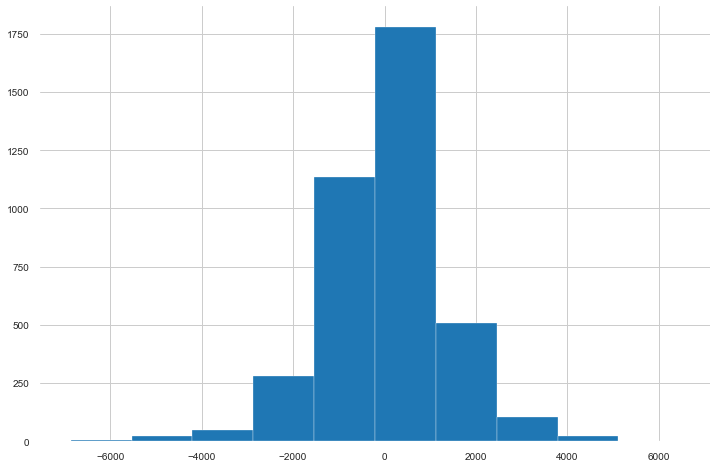

In [37]:
# разница прогнозов

plt.figure(figsize=[12,8])

plt.hist(y_test - preds)

plt.grid()

Видно, что есть больше ошибки, но в больнстве случаев модель хорошо предсказвает и разница прогнозов маленькая

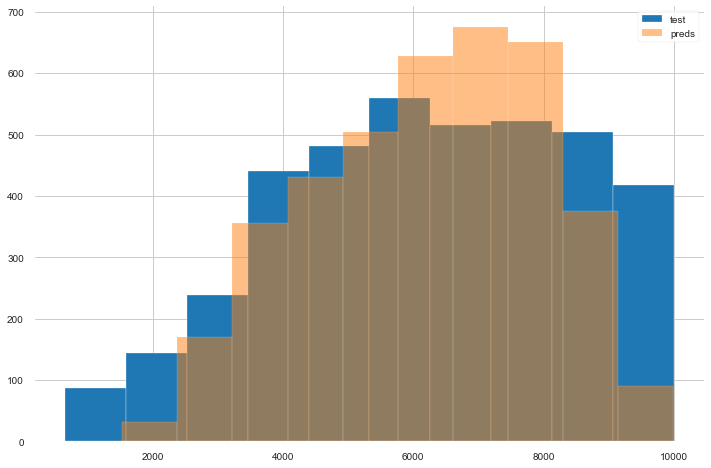

In [38]:
# две выборки

plt.figure(figsize=[12,8])

plt.hist(y_test,label='test')
plt.hist(preds, label='preds', alpha=0.5)
plt.legend()
plt.grid()

Есть как недооценённые модели, так и переоценённые

## Найдём недооценённые модели по состоянию

In [39]:
y_test_pd = pd.DataFrame(y_test,columns=['price'])

y_test_pd.head()

,price
0,5300.0
1,2895.0
2,6999.0
3,6988.0
4,6450.0


In [40]:
preds_pd = pd.DataFrame(preds,columns=['pred'])

preds_pd.head()

,pred
0,6422.71
1,3790.27
2,6804.86
3,6704.49
4,5487.15


In [41]:
errors_pd = pd.DataFrame(y_test - preds,columns=['errors'])

errors_pd.head()

,errors
0,-1122.71
1,-895.27
2,194.14
3,283.51
4,962.85


In [42]:
# вернём данные обрттно

X_test =  scaler.inverse_transform(X_test)

In [43]:
df_res = pd.DataFrame(X_test, columns=['region','year','manufacturer','model','condition','cylinders','fuel',
                              'odometer','title_status','transmission','vin','drive','size','type',
                              'paint_color','state','lat', 'long'])
df_res.head()

,region,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,vin,drive,size,type,paint_color,state,lat,long
0,271.0,2008.0,2.0,384.0,0.0,5.0,2.0,165653.0,0.0,0.0,14108.0,0.0,2.0,12.0,9.0,4.0,39.2965,-119.6590
1,35.0,2001.0,32.0,1776.0,2.0,3.0,2.0,177960.0,0.0,0.0,11438.0,0.0,1.0,0.0,8.0,19.0,42.7280,-71.1810
2,49.0,2011.0,27.0,2160.0,3.0,3.0,2.0,100450.0,0.0,0.0,12084.0,1.0,2.0,4.0,8.0,40.0,32.8598,-79.9841
3,278.0,2010.0,14.0,893.0,0.0,3.0,2.0,109103.0,0.0,0.0,114.0,1.0,3.0,9.0,8.0,4.0,38.6113,-121.4310
4,65.0,2007.0,14.0,443.0,0.0,3.0,2.0,105036.0,0.0,0.0,8498.0,1.0,2.0,9.0,9.0,35.0,40.0028,-83.1334


In [44]:
# объединим в data frame

df_res = df_res.join([y_test_pd, preds_pd, errors_pd])

df_res.head()

,region,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,...,drive,size,type,paint_color,state,lat,long,price,pred,errors
0,271.0,2008.0,2.0,384.0,0.0,5.0,2.0,165653.0,0.0,0.0,...,0.0,2.0,12.0,9.0,4.0,39.2965,-119.6590,5300.0,6422.71,-1122.71
1,35.0,2001.0,32.0,1776.0,2.0,3.0,2.0,177960.0,0.0,0.0,...,0.0,1.0,0.0,8.0,19.0,42.7280,-71.1810,2895.0,3790.27,-895.27
2,49.0,2011.0,27.0,2160.0,3.0,3.0,2.0,100450.0,0.0,0.0,...,1.0,2.0,4.0,8.0,40.0,32.8598,-79.9841,6999.0,6804.86,194.14
3,278.0,2010.0,14.0,893.0,0.0,3.0,2.0,109103.0,0.0,0.0,...,1.0,3.0,9.0,8.0,4.0,38.6113,-121.4310,6988.0,6704.49,283.51
4,65.0,2007.0,14.0,443.0,0.0,3.0,2.0,105036.0,0.0,0.0,...,1.0,2.0,9.0,9.0,35.0,40.0028,-83.1334,6450.0,5487.15,962.85


In [45]:
# сгруппируем по состоянию машины и посмотрим на сумму ошибок

df_res.groupby('condition').sum()[['errors']].sort_values(by='errors',ascending=True)

,errors
condition,
1.0,-150027.363016
2.0,-31506.661816
5.0,-8375.380000
4.0,4636.081667
3.0,64425.788420
0.0,284846.373234


In [53]:
# посмотрим на кол-вао моделей по состоянию

df_res.groupby('condition').count()[['errors']].sort_values(by='errors',ascending=False)

,errors
condition,
0.0,1954
2.0,1528
3.0,292
1.0,107
4.0,23
5.0,6


In [61]:
# отсортируем по состоянию

df_res.groupby('condition').sum()[['errors']].sort_values(by='condition',ascending=True)

,errors
condition,
0.0,284846.373234
1.0,-150027.363016
2.0,-31506.661816
3.0,64425.788420
4.0,4636.081667
5.0,-8375.380000


In [59]:
# посчитаем среднюю ошибку для каждого класса состояния 

sum_err_cond = df_res.groupby('condition').sum()[['errors']].sort_values(by='condition',ascending=True).to_numpy()
count_err_cond = df_res.groupby('condition').count()[['errors']].sort_values(by='condition',ascending=True).to_numpy()

mean_err_cond = sum_err_cond / count_err_cond

pd.DataFrame(mean_err_cond, columns=['mean err']).sort_values(by='mean err',ascending=True)

,mean err
1,-1402.124888
5,-1395.896667
2,-20.619543
0,145.776035
4,201.568768
3,220.636262


Даные были осортированы так, что индекс в это датафрейме - это состояние авто, закодированное Label Encoder. 

Получим обратно кодировщики

In [46]:
# посмотрим обозначения

for i in range(6):
    print(encoders['condition'].inverse_transform([i])) 

['excellent']
['fair']
['good']
['like new']
['new']
['salvage']


Если средняя ошибка отрицательна (напомню, test - preds), значит модель была переоценена алгоритом. 

Самое переоценнённое состояние авто : 1 - fair

Так же очень переоценено состояние 5 - salvage

Самое недооценённое состояние : 3 - like new, но совсем чуть-чуть

Можно сдлеать выводы, что модель больше переоценивает стоимость авто, чем недооценивает


## Найдём самые недооценённые модели по типу авто

In [62]:
# сгруппируем по типу машины и посмотрим на сумму ошибок

df_res.groupby('type').sum()[['errors']].sort_values(by='errors',ascending=True)

,errors
type,
9.0,-114528.937012
4.0,-18266.216825
7.0,-15244.658357
3.0,741.479333
6.0,2223.546667
1.0,2452.750000
12.0,12423.072778
5.0,14713.618762
11.0,14956.530723


In [64]:
# посмотрим на кол-вао моделей по типу

df_res.groupby('type').count()[['errors']].sort_values(by='errors',ascending=True)

,errors
type,
6.0,1
1.0,3
7.0,29
2.0,95
12.0,96
5.0,111
11.0,187
4.0,194
3.0,203


In [65]:
# отсортируем по типу

df_res.groupby('type').sum()[['errors']].sort_values(by='type',ascending=True)

,errors
type,
0.0,54690.052466
1.0,2452.750000
2.0,35035.163810
3.0,741.479333
4.0,-18266.216825
5.0,14713.618762
6.0,2223.546667
7.0,-15244.658357
8.0,56949.341985


In [66]:
# посчитаем среднюю ошибку для каждого типа авто 

sum_err_type = df_res.groupby('type').sum()[['errors']].sort_values(by='type',ascending=True).to_numpy()
count_err_type = df_res.groupby('type').count()[['errors']].sort_values(by='type',ascending=True).to_numpy()

mean_err_type = sum_err_type / count_err_type

pd.DataFrame(mean_err_type, columns=['mean err']).sort_values(by='mean err',ascending=True)

,mean err
7,-525.677874
4,-94.155757
9,-82.811957
3,3.652608
0,51.448779
11,79.981448
12,129.407008
5,132.555124
8,273.794913
10,349.712446


In [67]:
# посмотрим обозначения

for i in range(13):
    print(encoders['type'].inverse_transform([i])) 

['SUV']
['bus']
['convertible']
['coupe']
['hatchback']
['mini-van']
['offroad']
['other']
['pickup']
['sedan']
['truck']
['van']
['wagon']


Самые переоценённые : other - это нам ни о чем не говорит

Остальные вроде нормально

Самый недооценённый - offroad, но там всего один авто, что тоже некорректно

Следующий недооценённый - bus, там 3 экземпляра

В целом по типам авто всё хорошо

# Вывод

Такую аналитику можно провести по каждому категориальному признаку (или по конкретному нужному)

В целом результаты получились более-менее, но можно добиться лучшего Градиентым бустингом, поэтому я перемещаюсь в коллаб, чтобы там потестить cat boost regressor на gpu (это другой ноутбук)